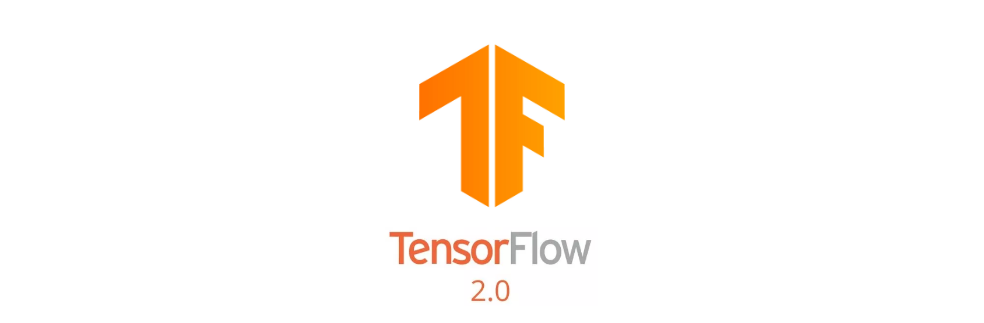

## Import packages

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
from os import path, getcwd, chdir

from tensorflow.python.keras.utils.vis_utils import plot_model
import pydot

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
print(tf.__version__)

2.6.0


## Variable and Constants

In [ ]:
variable = tf.Variable(1)
variable.assign_add(1)
print()
print("value:", variable.numpy())
variable = variable + 1
print("value:", variable.numpy())

<tf.Variable 'UnreadVariable' shape=() dtype=int32, numpy=2>


value: 2
value: 3


In [ ]:
helloworld = tf.constant("hello, TensorFlow")
print("Value  :", helloworld.numpy())

Value  : b'hello, TensorFlow'


### Basic Operation

In [ ]:
a = tf.constant(6)
b = tf.constant(3)

add = tf.add(a, b)
sub = tf.subtract(a, b)
mul = tf.multiply(a, b)
div = tf.divide(a, b)
mean = tf.reduce_mean([a, b])
sum = tf.reduce_sum([a, b,a])

# Access tensors value.
print("add =", add.numpy())
print("sub =", sub.numpy())
print("mul =", mul.numpy())
print("div =", div.numpy())

print("mean =", mean.numpy())
print("sum =", sum.numpy())

add = 9
sub = 3
mul = 18
div = 2.0
mean = 4
sum = 15


In [ ]:
# Matrix multiplications.
matrix1 = tf.constant([[1., 2.], [3., 4.]])
matrix2 = tf.constant([[5., 6.], [7., 8.]])
matrix1
matrix2
tf.matmul(matrix1, matrix2)

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[1., 2.],
       [3., 4.]], dtype=float32)>

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[5., 6.],
       [7., 8.]], dtype=float32)>

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[19., 22.],
       [43., 50.]], dtype=float32)>

### Automatic Gradient

### `f(x,y,z)=(x+y)z`

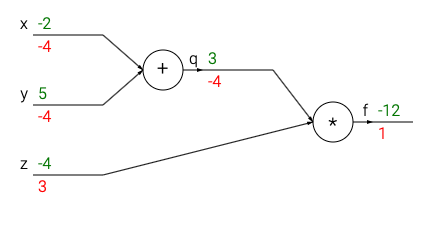

In [ ]:
x = tf.constant(-2.0)
y = tf.constant(5.0)
z = tf.constant(-4.0)
with tf.GradientTape(persistent=True) as tape:
    tape.watch(x)               # trace the tensor in the tape.
    tape.watch(y)
    tape.watch(z)
    q = x + y
    f = q * z
#y = x^2
df_df = tape.gradient(f, f)
df_dq = tape.gradient(f, q)
df_dx = tape.gradient(f, x)
df_dy = tape.gradient(f, y)
df_dz = tape.gradient(f, z)
#z = x^4
# dz_dx = t.gradient(z, x)
print("df/df=", df_df.numpy())
print("df/dq=", df_dq.numpy())
print("df/dx=", df_dx.numpy())
print("df/dy=", df_dy.numpy())
print("df/dz=", df_dz.numpy())

df/df= 1.0
df/dq= -4.0
df/dx= -4.0
df/dy= -4.0
df/dz= 3.0


### Graph Execution vs Eager Execution

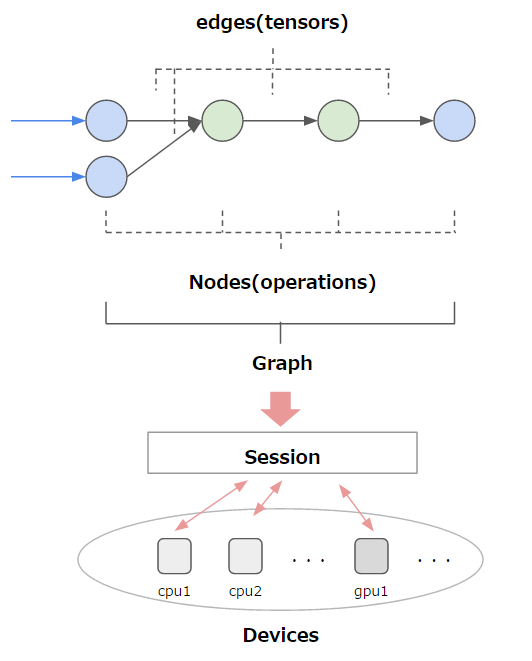

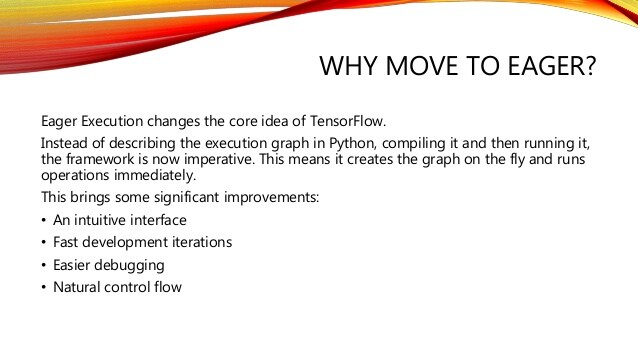

## Load Data

### Load data from Tensorflow

In [ ]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
x_train = x_train / 255.0
x_test = x_test / 255.0

# Use smaller subset -- speeds things up
x_train = x_train[:10000]
y_train = y_train[:10000]
x_test = x_test[:1000]
y_test = y_test[:1000]

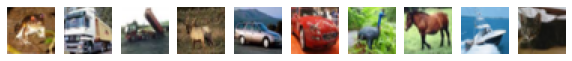

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 10, figsize=(10, 1))
for i in range(10):
    ax[i].set_axis_off()
    ax[i].imshow(x_train[i])

### Load Csv and convert to tensor data

In [ ]:
#csv_file = tf.keras.utils.get_file('/content/heart.csv', 'https://storage.googleapis.com/download.tensorflow.org/data/heart.csv')

In [ ]:
df = pd.read_csv('/content/heart.csv')
df.shape
df.head()

(303, 14)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,1,145,233,1,2,150,0,2.3,3,0,fixed,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3,normal,1
2,67,1,4,120,229,0,2,129,1,2.6,2,2,reversible,0
3,37,1,3,130,250,0,0,187,0,3.5,3,0,normal,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0,normal,0


In [ ]:
target = df.pop('target')
numeric_feature_names = ['age', 'thalach', 'trestbps',  'chol', 'oldpeak']
numeric_features = df[numeric_feature_names]

numeric_dataset = tf.data.Dataset.from_tensor_slices((numeric_features, target))

In [ ]:
for row in numeric_dataset.take(3):
  print(row)

(<tf.Tensor: shape=(5,), dtype=float64, numpy=array([ 63. , 150. , 145. , 233. ,   2.3])>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=array([ 67. , 108. , 160. , 286. ,   1.5])>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(5,), dtype=float64, numpy=array([ 67. , 129. , 120. , 229. ,   2.6])>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)


#### Shuffle and create batch

In [ ]:
num_data = numeric_dataset.shuffle(1000).batch(3)
for row in num_data.take(3):
  print(row)

(<tf.Tensor: shape=(3, 5), dtype=float64, numpy=
array([[ 65. , 157. , 140. , 417. ,   0.8],
       [ 46. , 156. , 101. , 197. ,   0. ],
       [ 44. , 188. , 130. , 219. ,   0. ]])>, <tf.Tensor: shape=(3,), dtype=int64, numpy=array([0, 0, 0])>)
(<tf.Tensor: shape=(3, 5), dtype=float64, numpy=
array([[ 42. , 194. , 120. , 240. ,   0.8],
       [ 44. , 175. , 108. , 141. ,   0.6],
       [ 61. , 138. , 140. , 207. ,   1.9]])>, <tf.Tensor: shape=(3,), dtype=int64, numpy=array([0, 0, 0])>)
(<tf.Tensor: shape=(3, 5), dtype=float64, numpy=
array([[ 51. , 142. , 140. , 308. ,   1.5],
       [ 65. , 151. , 160. , 360. ,   0.8],
       [ 51. , 154. ,  94. , 227. ,   0. ]])>, <tf.Tensor: shape=(3,), dtype=int64, numpy=array([0, 0, 0])>)


### Load images data

In [ ]:
# Load Images
with open("/content/files.txt") as f:
    dataset_file = f.read().splitlines()
# Load the whole dataset file, and slice each line.
data = tf.data.Dataset.from_tensor_slices(dataset_file)

In [ ]:
data = data.shuffle(buffer_size=1000)

# Load and pre-process images.
def load_image(path):
    # Read image from path.
    image = tf.io.read_file('/content/images/'+path)
    # Decode the jpeg image to array [0, 255].
    image = tf.image.decode_jpeg(image)
    # Resize images to a common size of 28 * 28.
    image = tf.image.resize(image, [28, 28])
    # Rescale values to [-1, 1].
    image = 1. - image / 127.5
    return image,0

# Use 'map' to apply the above functions
data = data.map(load_image)

data = data.batch(batch_size=2)

In [ ]:
for batch_x, batch_y in data.take(1):
    print(batch_x, batch_y)

tf.Tensor(
[[[[ 0.7822329   0.81864744  0.68363345]
   [ 0.58623445  0.6062424   0.47018802]
   [-0.00160038 -0.01728666 -0.13317299]
   ...
   [-0.99215686 -0.99215686 -0.99215686]
   [-0.99215686 -1.         -0.9607843 ]
   [ 0.03378397 -0.01047361 -0.20935392]]

  [[ 0.7904762   0.837535    0.7458183 ]
   [ 0.9594237   0.9358943   0.8653061 ]
   [ 0.6545818   0.67026806  0.56046414]
   ...
   [-0.99215686 -0.99215686 -0.99215686]
   [-0.99215686 -0.99215686 -0.99215686]
   [-0.99215686 -0.99215686 -0.9764706 ]]

  [[ 0.9689476   0.9767907   0.9297319 ]
   [ 0.8221688   0.8382552   0.7293316 ]
   [ 0.4408967   0.4633056   0.32084876]
   ...
   [-0.99215686 -0.99215686 -0.99215686]
   [-0.99215686 -0.99215686 -0.99215686]
   [-0.99215686 -0.99215686 -0.99215686]]

  ...

  [[ 0.46058518  0.28803617  0.6712297 ]
   [ 0.3839922   0.22672945  0.63497233]
   [ 0.7445379   0.64369726  0.87915146]
   ...
   [ 0.60400134  0.46282488  0.6353739 ]
   [ 0.7546219   0.62649083  0.8618645 ]
   [ 

### Load Text Data to Tensor

In [ ]:
from tensorflow.keras import utils
batch_size = 32
seed = 42

raw_train_ds = utils.text_dataset_from_directory(
    '/content/text/',
    batch_size=batch_size,
    seed=seed)

Found 18 files belonging to 4 classes.


In [ ]:
for text_batch, label_batch in raw_train_ds.take(1):
  for i in range(10):
    print("Question: ", text_batch.numpy()[i])
    print("Label:", label_batch.numpy()[i])

Question:  b"compare arraylists of chars alphabetically i've got my own class word and symbol. symbol is some wrapper for char. word is an  arraylist&lt;symbol&gt;..i need to sort arraylist&lt;word&gt; by number of occurrences of some symbol or if number of occurrence is the same - alphabetically. .how to do it? i think i need to override compareto method of class word and then use collections.sort. .but i don't know how to compare two words(two arraylists) alphabetically. ..here is part of symbol class..public class symbol implements comparable&lt;symbol&gt; {.    private char symbol;.    ......    @override.    public int compareto(symbol o) {.        return character.valueof(symbol).compareto(character.valueof(o.getsymbol()));.    }.}...and here is the part of word class..public class word implements comparable&lt;word&gt; {..    private arraylist&lt;symbol&gt; word;.    private symbol comparable_symbol;..    public int count(){ //number of occurrences.        int count = 0;.       

In [ ]:
from tensorflow.keras.layers import TextVectorization
VOCAB_SIZE = 1000
MAX_SEQUENCE_LENGTH = 250

int_vectorize_layer = TextVectorization(
    max_tokens=VOCAB_SIZE,
    output_mode='int',
    output_sequence_length=MAX_SEQUENCE_LENGTH)

train_text = raw_train_ds.map(lambda text, labels: text)
int_vectorize_layer.adapt(train_text)

In [ ]:
print("1289 ---> ", int_vectorize_layer.get_vocabulary()[125])
print("313 ---> ", int_vectorize_layer.get_vocabulary()[33])
print("Vocabulary size: {}".format(len(int_vectorize_layer.get_vocabulary())))

1289 --->  myaverage
313 --->  error
Vocabulary size: 1000


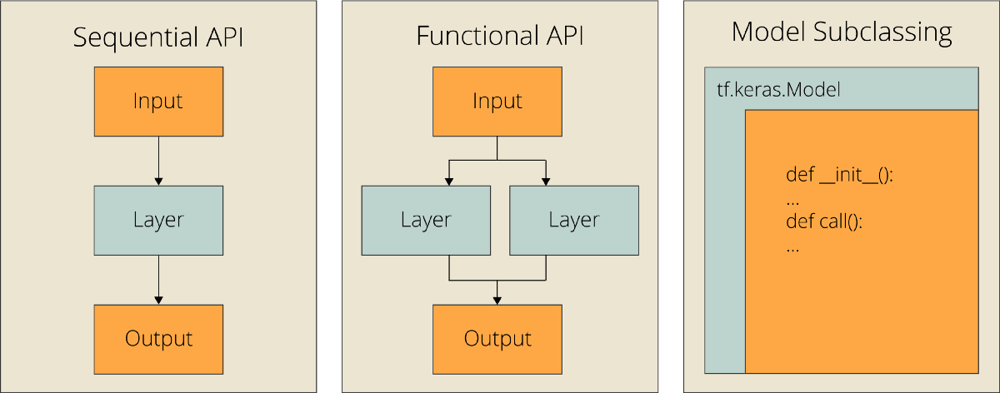

## Sequential API

### Building Model using Sequential Api

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Softmax

In [ ]:
model = Sequential([
    Dense(10,activation='relu',input_shape=(5,)),# 10*5 + 10
    Dense(1,activation='softmax') #10*1 + 1
])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 10)                60        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 11        
Total params: 71
Trainable params: 71
Non-trainable params: 0
_________________________________________________________________


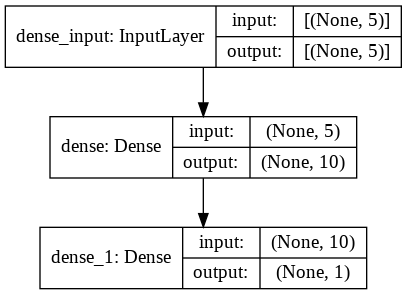

In [ ]:
tf.keras.utils.plot_model(model, to_file='img.png', show_shapes=True)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.binary_crossentropy,metrics=['acc','mae'])

In [ ]:
model.fit(num_data,epochs=2)

Epoch 1/5
101/101 [==============================] - 1s 1ms/step - loss: 56.8860 - acc: 0.2739 - mae: 0.7261
Epoch 2/5
101/101 [==============================] - 0s 2ms/step - loss: 8.5965 - acc: 0.2739 - mae: 0.7261
Epoch 3/5
101/101 [==============================] - 0s 1ms/step - loss: 5.6983 - acc: 0.2739 - mae: 0.7261
Epoch 4/5
101/101 [==============================] - 0s 1ms/step - loss: 4.3625 - acc: 0.2739 - mae: 0.7261
Epoch 5/5
101/101 [==============================] - 0s 1ms/step - loss: 3.4458 - acc: 0.2739 - mae: 0.7261


In [ ]:
# Evaluate the model on the test set
loss = model.evaluate(num_data)

101/101 [==============================] - 0s 956us/step - loss: 3.0269 - acc: 0.2739 - mae: 0.7261


### Add Regularisation

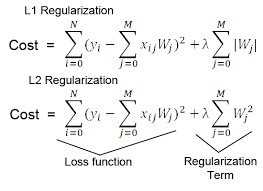

In [ ]:
model = tf.keras.models.Sequential([
        Dense(128,input_shape=(5,), activation="relu",kernel_regularizer=tf.keras.regularizers.l1(0.0001)),
        Dense(64, activation="relu",kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        tf.keras.layers.Dropout(0.3),
        Dense(32, activation="relu",kernel_regularizer=tf.keras.regularizers.L1L2(l1=0.0001,l2=0.001)),
        Dense(1)
    ])

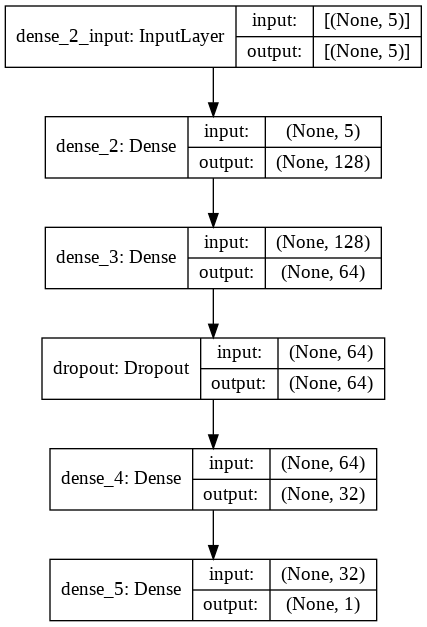

In [ ]:
tf.keras.utils.plot_model(model, to_file='img.png', show_shapes=True)

### Callbacks

- Custom CallBack : write your own callbacks
- EarlyStopping : For stopping the training if model is not improving or start overfitting
- ModelCheckpoint : Save the model weights
- ReduceLROnPlateau : Reduce the learning rate if model accuracy is not improving
- TensorBoard : model logs for the tensorboard to visualize

In [ ]:
# Write a custom callback
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

class TrainingCall(Callback):
    def on_predict_begin(self,logs=None):
        print(f'starting the training')
    def on_epoch_begin(self,epoch,logs=None):
        print(f'starting epoch {epoch}')
    def on_predict_batch_begin(self,batch,logs=None):
        print(f'starting the training batch {batch}')
    def on_predict_batch_end(self,batch,logs=None):
        print(f'ending the batch')

custom_callback = TrainingCall()
early_stoppage = EarlyStopping(monitor='loss',patience=3,mode='auto',min_delta=0.01)
checkpoint = ModelCheckpoint(filepath = '/content/model1/checkpoint_{epoch:02d}',save_weights_only=False,
                            verbose=1,frequency='epoch')
tensorboard = tf.keras.callbacks.TensorBoard(log_dir='logs',  update_freq='epoch')


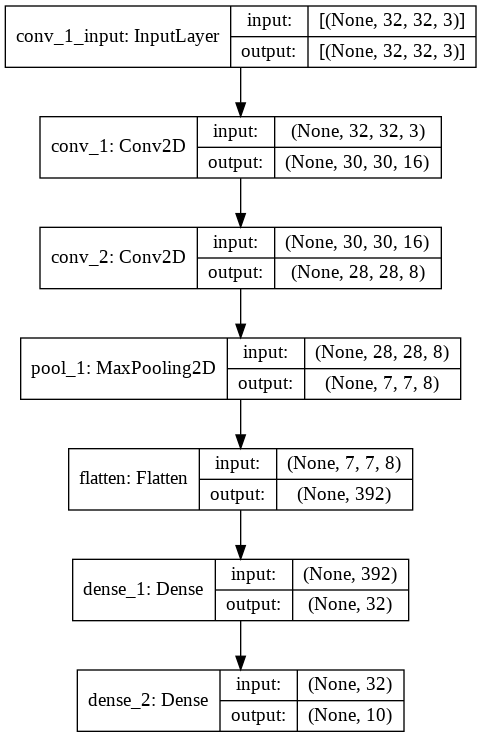

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D

def get_new_model():
    model = Sequential([
        Conv2D(filters=16, input_shape=(32, 32, 3), kernel_size=(3, 3), 
               activation='relu', name='conv_1'),
        Conv2D(filters=8, kernel_size=(3, 3), activation='relu', name='conv_2'),
        MaxPooling2D(pool_size=(4, 4), name='pool_1'),
        Flatten(name='flatten'),
        Dense(units=32, activation='relu', name='dense_1'),
        Dense(units=10, activation='softmax', name='dense_2')
    ])
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model
model = get_new_model()
tf.keras.utils.plot_model(model, to_file='img.png', show_shapes=True)

In [ ]:
history = model.fit(x_train,y_train,callbacks=[custom_callback,early_stoppage,checkpoint,tensorboard],epochs=3)

Epoch 1/3
starting epoch 0
313/313 [==============================] - 11s 33ms/step - loss: 1.9339 - accuracy: 0.2966

Epoch 00001: saving model to /content/model1/checkpoint_01
INFO:tensorflow:Assets written to: /content/model1/checkpoint_01/assets
Epoch 2/3
starting epoch 1
313/313 [==============================] - 10s 33ms/step - loss: 1.5796 - accuracy: 0.4259

Epoch 00002: saving model to /content/model1/checkpoint_02
INFO:tensorflow:Assets written to: /content/model1/checkpoint_02/assets
Epoch 3/3
starting epoch 2
313/313 [==============================] - 10s 33ms/step - loss: 1.4637 - accuracy: 0.4680

Epoch 00003: saving model to /content/model1/checkpoint_03
INFO:tensorflow:Assets written to: /content/model1/checkpoint_03/assets


In [ ]:
df = pd.DataFrame(history.history)
df.head()

,loss,accuracy
0,1.933874,0.2966
1,1.579582,0.4259
2,1.463727,0.4680


### Tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### Saving and Loading Model

In [ ]:
model.save('model.h5')

In [ ]:
del model

Load the Previously saved model

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/model1/checkpoint_01')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 30, 30, 16)        448       
_________________________________________________________________
conv_2 (Conv2D)              (None, 28, 28, 8)         1160      
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                12576     
_________________________________________________________________
dense_2 (Dense)              (None, 10)                330       
Total params: 14,514
Trainable params: 14,514
Non-trainable params: 0
__________________________________________________

Load Pretrained model

In [ ]:
from tensorflow.keras.applications import ResNet50
model = ResNet50(weights='imagenet')

102981632/102967424 [==============================] - 1s 0us/step


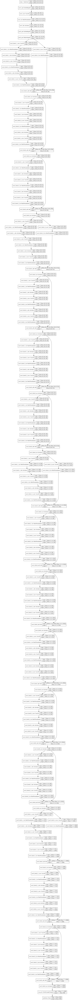

In [ ]:
# Build Keras ResNet50 model
tf.keras.utils.plot_model(model, to_file='img.png', show_shapes=True)

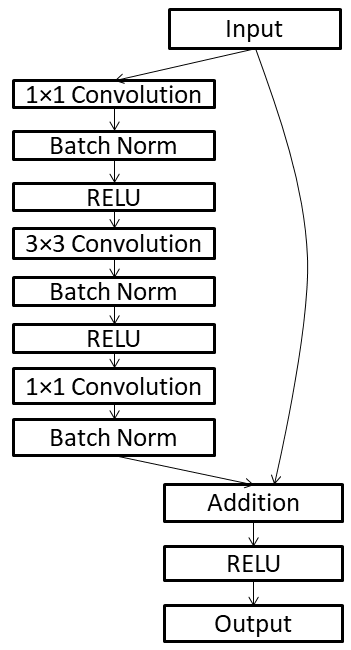

## Functional Api

### Create Custom Model

In [ ]:
from tensorflow.keras.models import Model
def build_model_with_sequential():
    seq_model = tf.keras.models.Sequential([tf.keras.layers.Flatten(input_shape=(28, 28)),
                                            tf.keras.layers.Dense(128, activation=tf.nn.relu),
                                            tf.keras.layers.Dense(10, activation=tf.nn.softmax)])
    return seq_model

def build_model_with_functional():
    # input Layer
    input_layer = tf.keras.Input(shape=(28, 28))
    # new_layer()(previous_layer)
    flatten_layer = tf.keras.layers.Flatten()(input_layer)
    first_dense = tf.keras.layers.Dense(128, activation=tf.nn.relu)(flatten_layer)
    output_layer = tf.keras.layers.Dense(10, activation=tf.nn.softmax)(first_dense)
    
    # declare inputs and outputs in Model
    func_model = Model(inputs=input_layer, outputs=output_layer)
    return func_model

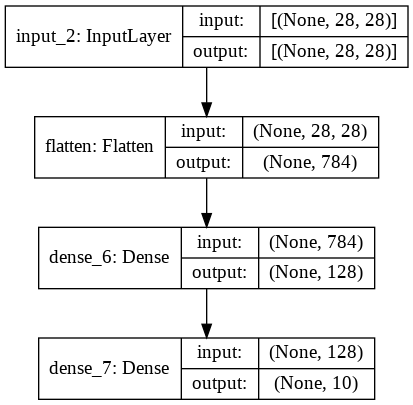

In [ ]:
model = build_model_with_functional()
# Plot model graph
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
# Define model layers.
inp = tf.keras.Input(shape=(28,))
inp1 = tf.keras.Input(shape=(5,))

first = tf.keras.layers.Dense(128,activation='relu')(inp)
second = tf.keras.layers.Dense(128,activation='relu')(first)

side_first = tf.keras.layers.Dense(128,activation='relu')(inp1)
side_second = tf.keras.layers.Dense(128,activation='relu')(side_first)

# skip connection
skip = tf.keras.layers.Dense(16,activation='relu')(side_second)

concat = tf.keras.layers.concatenate([second,side_second],axis=1)
x = tf.keras.layers.Dense(64,activation='relu')(concat)
x = tf.keras.layers.Dense(32,activation='relu')(x)
x = tf.keras.layers.Dense(16,activation='relu')(x)

x = tf.keras.layers.concatenate([x,skip],axis=1)

# Y1 output will be fed directly from the second dense
out1 = tf.keras.layers.Dense(10,name='y1_out')(x)
third = tf.keras.layers.Dense(64,activation='relu')(x)

# Y2 output will come via the third dense
out2 = tf.keras.layers.Dense(1,name='y2_out')(third)

# Define the model with the input layer and a list of output layers
model = Model(inputs=[inp,inp1],outputs=[out1,out2])

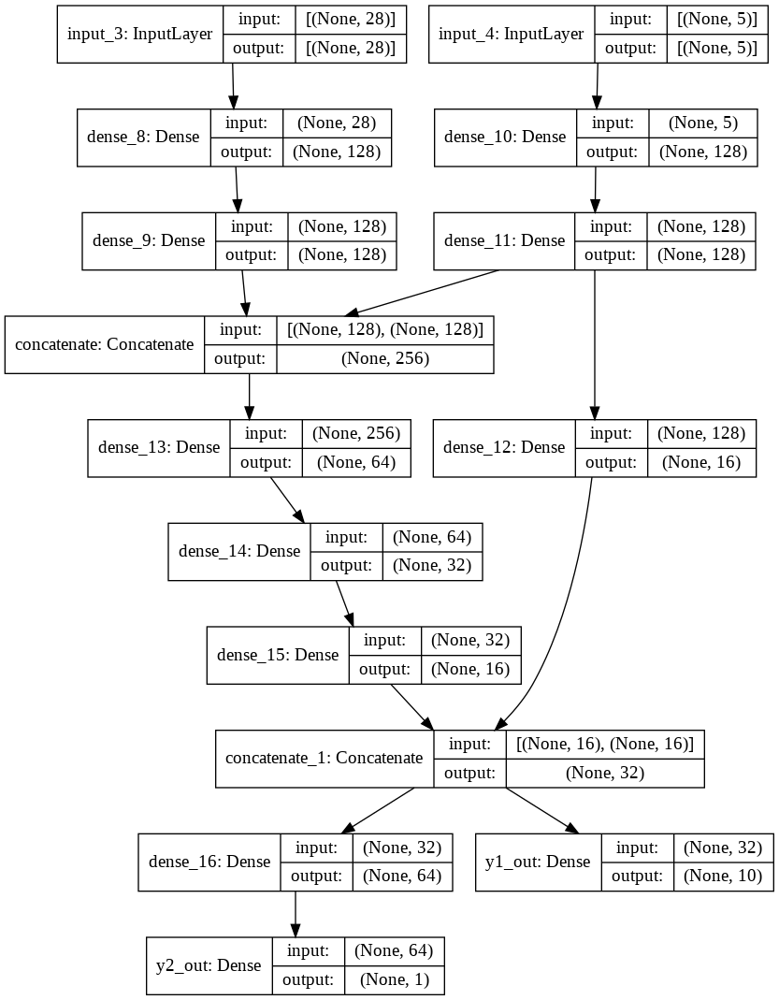

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
optimizer = tf.keras.optimizers.SGD(lr=0.001)
model.compile(optimizer=optimizer,
              loss={'y1_out': tf.keras.losses.CategoricalCrossentropy(), 'y2_out': 'mse'},
              metrics={'y1_out': tf.keras.metrics.Accuracy(),
                       'y2_out': tf.keras.metrics.RootMeanSquaredError()})

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


### Use Pretrained Model

In [ ]:
# Create the base model from the pre-trained model MobileNet V2
base_model = tf.keras.applications.MobileNetV2(input_shape=(32, 32, 3),
                                               include_top=False,
                                               weights='imagenet')
feature_batch = base_model(np.expand_dims(x_train[0], axis=0))
print(feature_batch.shape)

9420800/9406464 [==============================] - 0s 0us/step
(1, 1, 1, 1280)


In [ ]:
base_model.trainable = False
base_model.summary()

In [ ]:
inputs = tf.keras.Input(shape=(32, 32, 3))
x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(128)(x)
outputs = tf.keras.layers.Dense(10)(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
## Added the Mobilenet with over 2M parameters as frozen or non trainable
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 1, 1, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_17 (Dense)             (None, 128)               163968    
_________________________________________________________________
dense_18 (Dense)             (None, 10)                1290      
Total params: 2,423,242
Trainable params: 165,258
Non-trainable params: 2,257,984
___________________________________________

In [ ]:
history = model.fit(x_train,y_train,epochs=1)

313/313 [==============================] - 15s 40ms/step - loss: 3.1996 - accuracy: 0.1817


### Visualize Model Layers

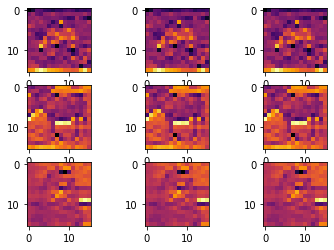

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras import models
f, axarr = plt.subplots(3,3)
FIRST_IMAGE=0
SECOND_IMAGE=7
THIRD_IMAGE=26
CONVOLUTION_NUMBER = 0
layer_outputs = [layer.output for layer in base_model.layers]
activation_model = tf.keras.models.Model(inputs = layer_outputs[0], outputs = layer_outputs[1:])
for x in range(0,3):
  f1 = activation_model.predict(x_train[FIRST_IMAGE].reshape(1, 32, 32, 3))[x]
  axarr[0,x].imshow(f1[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[0,x].grid(False)
  f2 = activation_model.predict(x_train[SECOND_IMAGE].reshape(1, 32, 32, 3))[x]
  axarr[1,x].imshow(f2[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[1,x].grid(False)
  f3 = activation_model.predict(x_train[THIRD_IMAGE].reshape(1, 32, 32, 3))[x]
  axarr[2,x].imshow(f3[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[2,x].grid(False)

### Use Lambda Layer

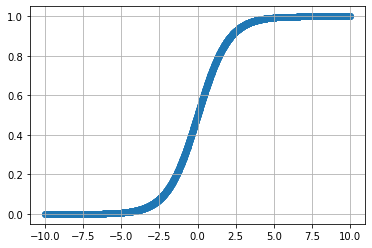

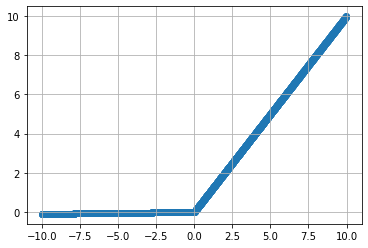

In [ ]:
def show_plot(X,Y):
  fig = plt.figure()
  ax = fig.gca()
  plt.scatter(X, Y)
  plt.grid()
  plt.show()

def lrelu(x):
  return  tf.where(x > 0, x, x * 0.01)

def sigmoid(X):
   return tf.math.sigmoid(X)

X = tf.range(-10,10,0.01)
sig_Y = sigmoid(X)
relu_Y = lrelu(X)

show_plot(X,sig_Y)
show_plot(X,relu_Y)

In [ ]:
def freakyrelu(x):
  return  tf.where(x > 0.65, sigmoid(x), lrelu(x))

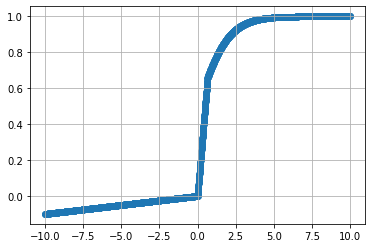

In [ ]:
freaky_Y = freakyrelu(X)

show_plot(X,freaky_Y)

In [ ]:
def build_model_with_functional():
    # input Tensor
    input_layer = tf.keras.Input(shape=(32, 32, 3))
    # new_layer()(previous_layer)
    x = tf.keras.layers.Flatten()(input_layer)
    x = tf.keras.layers.Dense(128)(x)
    x = tf.keras.activations.sigmoid(x)
    x = tf.keras.layers.Dense(64)(x)
    x = tf.keras.activations.sigmoid(x)
    output_layer = tf.keras.layers.Dense(10, activation=tf.nn.softmax)(x)
    
    # declare inputs and outputs
    func_model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)
    return func_model

In [ ]:
model = build_model_with_functional()
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(x_train,y_train,epochs=3)

Epoch 1/3
313/313 [==============================] - 2s 5ms/step - loss: 2.1834 - accuracy: 0.1927
Epoch 2/3
313/313 [==============================] - 2s 5ms/step - loss: 1.9664 - accuracy: 0.2774
Epoch 3/3
313/313 [==============================] - 2s 5ms/step - loss: 1.8938 - accuracy: 0.3114


In [ ]:
def build_freaky_model_with_functional():
    # input Tensor
    input_layer = tf.keras.Input(shape=(32, 32, 3))
    # new_layer()(previous_layer)
    x = tf.keras.layers.Flatten()(input_layer)
    x = tf.keras.layers.Dense(128)(x)
    ## Lambda layer with user defined function
    x = tf.keras.layers.Lambda(lambda x: freakyrelu(x))(x)
    x = tf.keras.layers.Dense(64)(x)
    x = tf.keras.layers.Lambda(lambda x: freakyrelu(x))(x)
    output_layer = tf.keras.layers.Dense(10, activation=tf.nn.softmax)(x)
    
    # declare inputs and outputs
    func_model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)
    return func_model

In [ ]:
model = build_freaky_model_with_functional()
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(x_train,y_train,epochs=3)

Epoch 1/3
313/313 [==============================] - 2s 6ms/step - loss: 2.1670 - accuracy: 0.1852
Epoch 2/3
313/313 [==============================] - 2s 6ms/step - loss: 2.0453 - accuracy: 0.2409
Epoch 3/3
313/313 [==============================] - 2s 6ms/step - loss: 1.9876 - accuracy: 0.2637


## Model Subclassing

### Define Own layer

In [ ]:
class Mylayer(tf.keras.layers.Layer):
    def __init__(self,input_dims, units=32):
        '''Initializes the class and sets up the internal variables'''
        super(Mylayer, self).__init__()
        self.a = self.add_weight(shape=(input_dims,units),
                                 initializer='random_normal')
        self.b = self.add_weight(shape=(input_dims,units),
                                 initializer='random_normal')
        self.c = self.add_weight(shape=(units),
                                 initializer='zero')
   
    def call(self, inputs):
        '''Defines the computation from inputs to outputs'''
        # Remember to use self.activation() to get the final output
        x_squared = tf.math.square(inputs)
        # ax^2 + bx + c
        x = tf.matmul(x_squared, self.a) + tf.matmul(inputs, self.b) + self.c
        x = tf.keras.layers.Lambda(lambda x: freakyrelu(x))(x)
        return x

In [ ]:
dense_layer = Mylayer(5,3)
activation_means = dense_layer(tf.ones((1, 5)))
print(activation_means.numpy())

[[ 0.05179161 -0.00227971  0.19566704]]


### Define Own Model

In [ ]:
class MyModel(tf.keras.models.Model):

    def __init__(self, units_1=128, units_2=64, units_3=10):
        super(MyModel, self).__init__()
        # Define layers
        self.layer_1 = Mylayer(3072,units_1)
        self.drop1 = tf.keras.layers.Dropout(0.3)
        self.layer_2 = Mylayer(units_1,units_2)
        self.dense1 = tf.keras.layers.Dense(units_3,activation='relu')
        self.softmax = tf.keras.layers.Softmax()
        
    def call(self, inputs):
        # Define forward pass
        input_layer = tf.keras.layers.Flatten()(inputs)
        x = self.layer_1(input_layer)
        x = self.drop1(x)
        x = self.layer_2(x)
        x = self.dense1(x)
        return self.softmax(x)

In [ ]:
model = MyModel(128,64,10)
print(model(np.expand_dims(x_train[0], axis=0)))
model.summary()

tf.Tensor(
[[0.09829315 0.08628888 0.09927232 0.08628888 0.08628888 0.08628888
  0.08628888 0.16040541 0.1229962  0.08758862]], shape=(1, 10), dtype=float32)
Model: "my_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mylayer_1 (Mylayer)          multiple                  786560    
_________________________________________________________________
dropout_2 (Dropout)          multiple                  0         
_________________________________________________________________
mylayer_2 (Mylayer)          multiple                  16448     
_________________________________________________________________
dense_25 (Dense)             multiple                  650       
_________________________________________________________________
softmax (Softmax)            multiple                  0         
Total params: 803,658
Trainable params: 803,658
Non-trainable params: 0
__________________________

### Define Own Training Loop

In [ ]:
# Define the categorical cross entropy loss and Adam optimizer
from tensorflow.keras.utils import to_categorical
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [ ]:
## create the Gradient calculate function using Automatic gradient
def grad(model, inputs, targets):
    with tf.GradientTape() as tape:
        pred_y = model(inputs)
        loss_value = loss_object( tf.cast(targets, tf.float32),tf.cast(pred_y, tf.float32))
    return loss_value,tape.gradient(loss_value, model.trainable_variables)

In [ ]:
# Implement the training loop
train_data = tf.data.Dataset.from_tensor_slices((x_train,y_train))

train_data = train_data.batch(32)

train_loss = []
train_acc = []
epoch = 2
for i in range(epoch):
    
    epoch_loss = tf.keras.metrics.Mean()
    epoch_acc = tf.keras.metrics.CategoricalAccuracy()
    
    for train1,labe in train_data:
        loss_value,grads = grad(model,train1,labe)
        optimizer.apply_gradients(zip(grads,model.trainable_variables))
        
        epoch_loss(loss_value)
        
        epoch_acc(to_categorical(labe), model(train1))
    
    train_loss.append(epoch_loss.result())
    train_acc.append(epoch_acc.result())
    
    print(f'epoch {i}, epoch_loss {epoch_loss.result()}, epoch_accuracy {epoch_acc.result()}')

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=1>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2499504>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=2>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3039744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=3>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3179216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=4>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3139782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.171875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=5>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3125172>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=6>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3100424>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18229167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=7>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3077989>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17857143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=8>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3106136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1640625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=9>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3021696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1736111>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=10>

<tf.Tensor: shape=(), dtype=float32, numpy=2.298749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=11>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3000991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16193181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=12>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3011425>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16145833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=13>

<tf.Tensor: shape=(), dtype=float32, numpy=2.3013685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15865384>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=14>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2969868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16964285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=15>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2975495>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16458334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=16>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2956252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16601562>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=17>

<tf.Tensor: shape=(), dtype=float32, numpy=2.293844>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16911764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=18>

<tf.Tensor: shape=(), dtype=float32, numpy=2.29403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=19>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2947607>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16447368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=20>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2937388>

<tf.Tensor: shape=(), dtype=float32, numpy=0.165625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=21>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2906945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17261904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=22>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2905538>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17045455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=23>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2910829>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16576087>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=24>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2910464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16536458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=25>

<tf.Tensor: shape=(), dtype=float32, numpy=2.290352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=26>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2915764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15985577>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=27>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2927196>

<tf.Tensor: shape=(), dtype=float32, numpy=0.15972222>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=28>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2912307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16071428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=29>

<tf.Tensor: shape=(), dtype=float32, numpy=2.291365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16271552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=30>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2908552>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16145833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=31>

<tf.Tensor: shape=(), dtype=float32, numpy=2.290542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16028225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=32>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2906783>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16015625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=33>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2888458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16666667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=34>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2883034>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16819853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=35>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2871673>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17053571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=36>

<tf.Tensor: shape=(), dtype=float32, numpy=2.288506>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16840278>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=37>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2893035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16722973>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=38>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2897823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16776316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=39>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2856271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17227565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=40>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2840586>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17265625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=41>

<tf.Tensor: shape=(), dtype=float32, numpy=2.286634>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16844513>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=42>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2849877>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1688988>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=43>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2850692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16860466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=44>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.171875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=45>

<tf.Tensor: shape=(), dtype=float32, numpy=2.280083>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17291667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=46>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2793462>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17119566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=47>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2803676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16888298>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=48>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2797763>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16992188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=49>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2812848>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16645408>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=50>

<tf.Tensor: shape=(), dtype=float32, numpy=2.280788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=51>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2784715>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1672794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=52>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2769346>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1688702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=53>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2762098>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1692217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=54>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2763393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1712963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=55>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2762675>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17159091>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=56>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2758732>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17075893>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=57>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2754548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17105263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=58>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2755642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1713362>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=59>

<tf.Tensor: shape=(), dtype=float32, numpy=2.275409>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17108051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=60>

<tf.Tensor: shape=(), dtype=float32, numpy=2.274768>

<tf.Tensor: shape=(), dtype=float32, numpy=0.171875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=61>

<tf.Tensor: shape=(), dtype=float32, numpy=2.274746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17264344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=62>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2737548>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17237903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=63>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2744853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17212301>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=64>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2756429>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17041016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=65>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2760365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.16971155>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=66>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2750359>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17092803>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=67>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2747662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17024253>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=68>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2733216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17233455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=69>

<tf.Tensor: shape=(), dtype=float32, numpy=2.272758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17255434>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=70>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2714999>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17410715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=71>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2723126>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17385563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=72>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2713633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17447917>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=73>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2713943>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17380136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=74>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2703733>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17483108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=75>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2706075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=76>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2713926>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17434211>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=77>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2709827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17491883>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=78>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2695384>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17548077>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=79>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2686281>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17681962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=80>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2681115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17695312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=81>

<tf.Tensor: shape=(), dtype=float32, numpy=2.268263>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17631173>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=82>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2674735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17682926>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=83>

<tf.Tensor: shape=(), dtype=float32, numpy=2.26582>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17771085>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=84>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2654316>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17782739>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=85>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2653694>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17720588>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=86>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2661164>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17623547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=87>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2661679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17564656>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=88>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2660685>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17507102>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=89>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2636793>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1755618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=90>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2642174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17534722>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=91>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2636096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17582418>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=92>

<tf.Tensor: shape=(), dtype=float32, numpy=2.261162>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17900816>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=93>

<tf.Tensor: shape=(), dtype=float32, numpy=2.260521>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17943548>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=94>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2598968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.17985372>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=95>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2598736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18026316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=96>

<tf.Tensor: shape=(), dtype=float32, numpy=2.260217>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18033855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=97>

<tf.Tensor: shape=(), dtype=float32, numpy=2.260307>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18105671>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=98>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2598226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18112245>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=99>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2593796>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18118687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=100>

<tf.Tensor: shape=(), dtype=float32, numpy=2.259323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1809375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=101>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2590938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18131188>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=102>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2575846>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18167892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=103>

<tf.Tensor: shape=(), dtype=float32, numpy=2.257815>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18112864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=104>

<tf.Tensor: shape=(), dtype=float32, numpy=2.25679>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18179086>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=105>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2567205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18184523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=106>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2569466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18130895>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=107>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2566752>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18136682>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=108>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2563334>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18200232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=109>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2564275>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18205275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=110>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2556818>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18267046>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=111>

<tf.Tensor: shape=(), dtype=float32, numpy=2.254615>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18355855>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=112>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2547956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18387277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=113>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2536714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18501106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=114>

<tf.Tensor: shape=(), dtype=float32, numpy=2.253161>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18503289>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=115>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2528884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18505435>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=116>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2513256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1869612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=117>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2502136>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18803419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=118>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2489202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18776482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=119>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2490878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1877626>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=120>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2487912>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18776041>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=121>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2481863>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18801653>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=122>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18775615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=123>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248041>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18800813>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=124>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248708>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18775202>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=125>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2478971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18825>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=126>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18799603>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=127>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2484267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18848425>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=128>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2486148>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18798828>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=129>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2489913>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18725775>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=130>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248705>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18701923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=131>

<tf.Tensor: shape=(), dtype=float32, numpy=2.248641>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18726145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=132>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2474537>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1891572>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=133>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2474823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.18961467>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=134>

<tf.Tensor: shape=(), dtype=float32, numpy=2.246982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19053172>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=135>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2460153>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19212963>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=136>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2458847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19232537>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=137>

<tf.Tensor: shape=(), dtype=float32, numpy=2.24605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19206205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=138>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2451482>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19270833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=139>

<tf.Tensor: shape=(), dtype=float32, numpy=2.244901>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19244604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=140>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2451053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19196428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=141>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2456176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19148937>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=142>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2460306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19080105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=143>

<tf.Tensor: shape=(), dtype=float32, numpy=2.246238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1909965>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=144>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2463367>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1905382>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=145>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2459884>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1911638>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=146>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2453227>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19156678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=147>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2449317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19217686>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=148>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2443817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19214527>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=149>

<tf.Tensor: shape=(), dtype=float32, numpy=2.243714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19295302>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=150>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2438958>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=151>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2431138>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19308774>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=152>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2432842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19284539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=153>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2431874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19321896>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=154>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2427971>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19358766>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=155>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2431176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=156>

<tf.Tensor: shape=(), dtype=float32, numpy=2.242343>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19411057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=157>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2425232>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19347134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=158>

<tf.Tensor: shape=(), dtype=float32, numpy=2.242179>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19363134>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=159>

<tf.Tensor: shape=(), dtype=float32, numpy=2.242115>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19359277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=160>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2427888>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19316407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=161>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2433975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19274068>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=162>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2430842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19290124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=163>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2438252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19210123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=164>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2435782>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19207317>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=165>

<tf.Tensor: shape=(), dtype=float32, numpy=2.243391>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19242424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=166>

<tf.Tensor: shape=(), dtype=float32, numpy=2.242692>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19295934>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=167>

<tf.Tensor: shape=(), dtype=float32, numpy=2.242835>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1925524>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=168>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2422237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19345239>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=169>

<tf.Tensor: shape=(), dtype=float32, numpy=2.241677>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19341716>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=170>

<tf.Tensor: shape=(), dtype=float32, numpy=2.241842>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19393383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=171>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2417536>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1942617>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=172>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2409344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19440407>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=173>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2408016>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19454479>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=174>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2413273>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19396552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=175>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2407165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19446428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=176>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2402956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19477983>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=177>

<tf.Tensor: shape=(), dtype=float32, numpy=2.240036>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19509181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=178>

<tf.Tensor: shape=(), dtype=float32, numpy=2.238957>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19557585>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=179>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2390847>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19553073>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=180>

<tf.Tensor: shape=(), dtype=float32, numpy=2.239203>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1953125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=181>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2393456>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19544199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=182>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2395234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19488324>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=183>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2397542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19467214>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=184>

<tf.Tensor: shape=(), dtype=float32, numpy=2.239298>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19463316>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=185>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2388887>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19527027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=186>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2385268>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19539651>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=187>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2386746>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19535428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=188>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2381005>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19564494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=189>

<tf.Tensor: shape=(), dtype=float32, numpy=2.238112>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19560185>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=190>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2382941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19572368>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=191>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2382152>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19551702>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=192>

<tf.Tensor: shape=(), dtype=float32, numpy=2.238215>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19563802>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=193>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2374341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19608161>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=194>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2372868>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19555412>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=195>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2375174>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19535257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=196>

<tf.Tensor: shape=(), dtype=float32, numpy=2.237414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19579081>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=197>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2371323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19606599>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=198>

<tf.Tensor: shape=(), dtype=float32, numpy=2.237274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19570707>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=199>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2372525>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19582286>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=200>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2374449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19578125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=201>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2371397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19574004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=202>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2370665>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19523515>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=203>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2370799>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19535099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=204>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364748>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19577205>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=205>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364542>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19557928>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=206>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19584344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=207>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1959541>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=208>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2360997>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19591346>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=209>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362254>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19617225>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=210>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19642857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=211>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359803>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19697867>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=212>

<tf.Tensor: shape=(), dtype=float32, numpy=2.235823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19693395>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=213>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359025>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19659625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=214>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361135>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19699182>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=215>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364597>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19665697>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=216>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2366037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1964699>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=217>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2365663>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19671659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=218>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2367253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19653097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=219>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2367303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19648972>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=220>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2365184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19673295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=221>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361588>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19711539>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=222>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236379>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1969313>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=223>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2360704>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19716929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=224>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1968471>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=225>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2369401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19652778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=226>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2369993>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19634956>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=227>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2368479>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19686124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=228>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363029>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19750549>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=229>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364757>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19718887>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=230>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2366896>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19728261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=231>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2367651>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19710498>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=232>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2369976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19665948>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=233>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364278>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19742489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=234>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19778311>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=235>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19853723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=236>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19835804>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=237>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19818038>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=238>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364645>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19813551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=239>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364767>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19822176>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=240>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19791667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=241>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362661>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1976141>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=242>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2366605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19757232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=243>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364311>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19765946>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=244>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2366095>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19710553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=245>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2365081>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19732143>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=246>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2367146>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19715448>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=247>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2367184>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1972419>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=248>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19732863>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=249>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2364264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19741465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=250>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236269>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=251>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359529>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19746016>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=252>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2355452>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19742064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=253>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2356725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19713439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=254>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2356074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19709645>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=255>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2357354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19693628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=256>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359638>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19677734>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=257>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362945>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19674124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=258>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361248>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19682655>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=259>

<tf.Tensor: shape=(), dtype=float32, numpy=2.235947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1969112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=260>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2357018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.196875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=261>

<tf.Tensor: shape=(), dtype=float32, numpy=2.23599>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19659962>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=262>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362998>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19632633>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=263>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362058>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19629277>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=264>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2360055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19637784>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=265>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19610849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=266>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19607612>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=267>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1962781>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=268>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236251>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19601212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=269>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2363408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19598049>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=270>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2362206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19594908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=271>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19580258>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=272>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236099>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19554228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=273>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19585623>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=274>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361941>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19571167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=275>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236238>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19545455>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=276>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236053>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19565217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=277>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2358427>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19584838>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=278>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2360458>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19559352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=279>

<tf.Tensor: shape=(), dtype=float32, numpy=2.236419>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1953405>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=280>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361188>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19564731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=281>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361603>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19550712>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=282>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361817>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19558954>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=283>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19611308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=284>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2361522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19597271>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=285>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2359514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19583334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=286>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2357564>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19613199>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=287>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2354105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19664635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=288>

<tf.Tensor: shape=(), dtype=float32, numpy=2.235306>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19661458>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=289>

<tf.Tensor: shape=(), dtype=float32, numpy=2.235006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19723183>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=290>

<tf.Tensor: shape=(), dtype=float32, numpy=2.234678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19719827>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=291>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2348294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19705756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=292>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2349045>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19713184>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=293>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2347329>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19720563>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=294>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2348576>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19717261>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=295>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2347736>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1973517>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=296>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2351954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19721285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=297>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2350714>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19718014>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=298>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2353096>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19693792>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=299>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2354724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19659281>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=300>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2357721>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19604167>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=301>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2357574>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19601329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=302>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2352252>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19629553>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=303>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2347777>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19667904>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=304>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2345052>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19654605>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=305>

<tf.Tensor: shape=(), dtype=float32, numpy=2.234317>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19661885>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=306>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2343702>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19669117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=307>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2343385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19666123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=308>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2342067>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19663149>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=309>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2338827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19660194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=310>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2340019>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19637097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=311>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2338676>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19644293>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=312>

<tf.Tensor: shape=(), dtype=float32, numpy=2.233486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19701523>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=313>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2340157>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1968>

epoch 0, epoch_loss 2.234015703201294, epoch_accuracy 0.19679999351501465


<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=314>

<tf.Tensor: shape=(), dtype=float32, numpy=2.0968795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.34375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=315>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2444916>

<tf.Tensor: shape=(), dtype=float32, numpy=0.234375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=316>

<tf.Tensor: shape=(), dtype=float32, numpy=2.246845>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20833333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=317>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2152114>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2265625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=318>

<tf.Tensor: shape=(), dtype=float32, numpy=2.226144>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=319>

<tf.Tensor: shape=(), dtype=float32, numpy=2.230037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19791667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=320>

<tf.Tensor: shape=(), dtype=float32, numpy=2.216874>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20535715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=321>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2027788>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=322>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1909056>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=323>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192324>

<tf.Tensor: shape=(), dtype=float32, numpy=0.215625>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=324>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194878>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20738636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=325>

<tf.Tensor: shape=(), dtype=float32, numpy=2.199212>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20052083>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=326>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2111933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19951923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=327>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2078938>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20089285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=328>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2083633>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20416667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=329>

<tf.Tensor: shape=(), dtype=float32, numpy=2.207288>

<tf.Tensor: shape=(), dtype=float32, numpy=0.203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=330>

<tf.Tensor: shape=(), dtype=float32, numpy=2.20891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19669117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=331>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2067401>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19791667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=332>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2061336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20065789>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=333>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2008271>

<tf.Tensor: shape=(), dtype=float32, numpy=0.203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=334>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2017205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19642857>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=335>

<tf.Tensor: shape=(), dtype=float32, numpy=2.206014>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19318181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=336>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2053072>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19429348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=337>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2055862>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19401042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=338>

<tf.Tensor: shape=(), dtype=float32, numpy=2.203639>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1975>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=339>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2096891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19350961>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=340>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2103503>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19328703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=341>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2114656>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19196428>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=342>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2086985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1961207>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=343>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2066486>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19270833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=344>

<tf.Tensor: shape=(), dtype=float32, numpy=2.205889>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19455644>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=345>

<tf.Tensor: shape=(), dtype=float32, numpy=2.205891>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19335938>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=346>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2048433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19602273>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=347>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2034414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.1985294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=348>

<tf.Tensor: shape=(), dtype=float32, numpy=2.20339>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20089285>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=349>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2054222>

<tf.Tensor: shape=(), dtype=float32, numpy=0.19878472>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=350>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2048423>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20016892>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=351>

<tf.Tensor: shape=(), dtype=float32, numpy=2.206289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20148027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=352>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2021933>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20592949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=353>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1997216>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2078125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=354>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2027428>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20579268>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=355>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2001975>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20461309>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=356>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2007737>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20421511>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=357>

<tf.Tensor: shape=(), dtype=float32, numpy=2.195505>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20738636>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=358>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1934245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20833333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=359>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942086>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20788044>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=360>

<tf.Tensor: shape=(), dtype=float32, numpy=2.197207>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20678191>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=361>

<tf.Tensor: shape=(), dtype=float32, numpy=2.196516>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20833333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=362>

<tf.Tensor: shape=(), dtype=float32, numpy=2.197724>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20790817>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=363>

<tf.Tensor: shape=(), dtype=float32, numpy=2.197534>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=364>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1948323>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21139705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=365>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193991>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21153846>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=366>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1946602>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20990565>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=367>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1955776>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20891203>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=368>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1959758>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20965908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=369>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1961632>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2109375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=370>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1952348>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21271929>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=371>

<tf.Tensor: shape=(), dtype=float32, numpy=2.196612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2112069>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=372>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1983342>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20974576>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=373>

<tf.Tensor: shape=(), dtype=float32, numpy=2.199478>

<tf.Tensor: shape=(), dtype=float32, numpy=0.209375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=374>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2008944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20952868>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=375>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1995218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20917338>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=376>

<tf.Tensor: shape=(), dtype=float32, numpy=2.200772>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20882936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=377>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2032468>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20703125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=378>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2045982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20576923>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=379>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2035944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2059659>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=380>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2038176>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20615672>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=381>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2016246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2077206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=382>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2017398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20833333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=383>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2006412>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21026786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=384>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2021883>

<tf.Tensor: shape=(), dtype=float32, numpy=0.20950705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=385>

<tf.Tensor: shape=(), dtype=float32, numpy=2.201583>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21137153>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=386>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2028084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21018836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=387>

<tf.Tensor: shape=(), dtype=float32, numpy=2.201873>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21157095>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=388>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2027774>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21166667>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=389>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2031608>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21217105>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=390>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2030244>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21306819>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=391>

<tf.Tensor: shape=(), dtype=float32, numpy=2.2012906>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21434295>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=392>

<tf.Tensor: shape=(), dtype=float32, numpy=2.199749>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21479431>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=393>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1991744>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21484375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=394>

<tf.Tensor: shape=(), dtype=float32, numpy=2.199696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21450618>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=395>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1994352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21493903>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=396>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1974108>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21649097>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=397>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1966002>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21651785>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=398>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1971385>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21544118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=399>

<tf.Tensor: shape=(), dtype=float32, numpy=2.197396>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21511628>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=400>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1981237>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21443966>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=401>

<tf.Tensor: shape=(), dtype=float32, numpy=2.197915>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21448864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=402>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1958373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21523876>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=403>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1967084>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21493055>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=404>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1966398>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21462911>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=405>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1935341>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21773098>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=406>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1934626>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21807796>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=407>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930678>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21841756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=408>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21842106>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=409>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945982>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21777344>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=410>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949723>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21746135>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=411>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941562>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21779336>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=412>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1946266>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21748738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=413>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194872>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2175>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=414>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1950483>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21844059>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=415>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193352>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21966912>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=416>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2184466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=417>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930985>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21935096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=418>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1932092>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21994048>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=419>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1933289>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21992925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=420>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1938596>

<tf.Tensor: shape=(), dtype=float32, numpy=0.21904206>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=421>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1939037>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2193287>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=422>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1939833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22018349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=423>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.221875>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=424>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192228>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22184685>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=425>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192592>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22237723>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=426>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191555>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22345133>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=427>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2236842>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=428>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191512>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22336957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=429>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1905117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22440733>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=430>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1893208>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22596154>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=431>

<tf.Tensor: shape=(), dtype=float32, numpy=2.187756>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22801907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=432>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1879158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22794117>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=433>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1876245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22734375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=434>

<tf.Tensor: shape=(), dtype=float32, numpy=2.18646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22804752>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=435>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1865823>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22822747>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=436>

<tf.Tensor: shape=(), dtype=float32, numpy=2.186627>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22789635>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=437>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1874413>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22757056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=438>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1869612>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=439>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1875794>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22693452>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=440>

<tf.Tensor: shape=(), dtype=float32, numpy=2.188392>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22637795>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=441>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1887178>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22631836>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=442>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1895118>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22601745>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=443>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1890206>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2264423>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=444>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1898565>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22566794>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=445>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1883202>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22679925>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=446>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1887345>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22650376>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=447>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1884446>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22691232>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=448>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1877277>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22777778>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=449>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1879444>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22748162>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=450>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1884463>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22718978>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=451>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1878593>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22690217>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=452>

<tf.Tensor: shape=(), dtype=float32, numpy=2.187996>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2266187>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=453>

<tf.Tensor: shape=(), dtype=float32, numpy=2.188336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22611608>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=454>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1893158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22562057>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=455>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1901183>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22491197>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=456>

<tf.Tensor: shape=(), dtype=float32, numpy=2.19055>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22443181>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=457>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191021>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22395833>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=458>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22392242>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=459>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1908383>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22367294>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=460>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1907701>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22406463>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=461>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1902947>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22466215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=462>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1897488>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22441275>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=463>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1902354>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22375>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=464>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1896522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22392385>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=465>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1899416>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22347862>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=466>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1902828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22303921>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=467>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1903105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22301136>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=468>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1911824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22298387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=469>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1906974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22315705>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=470>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1906245>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22292994>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=471>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1905258>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22290348>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=472>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1904683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22268082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=473>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2220703>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=474>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1919417>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2216615>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=475>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1920009>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22164352>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=476>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192853>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2208589>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=477>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1926925>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22046494>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=478>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929653>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22045454>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=479>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1925838>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22119729>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=480>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22099552>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=481>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1925333>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22154018>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=482>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1920571>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22170858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=483>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1925852>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22169118>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=484>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1926358>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22130848>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=485>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1921332>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22147529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=486>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1924205>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22182082>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=487>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1933684>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22126436>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=488>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930811>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22160715>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=489>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1928344>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2215909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=490>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22139831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=491>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1915338>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22226124>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=492>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1918833>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22189246>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=493>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1922987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22135417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=494>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1928668>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22099447>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=495>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1934395>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22098215>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=496>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1940093>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22045764>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=497>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1934464>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22078805>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=498>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929827>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22094594>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=499>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929076>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22076613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=500>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1933143>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22042112>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=501>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1926956>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22107713>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=502>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1927414>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22139551>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=503>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1932116>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22105263>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=504>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2213678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=505>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1931977>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22102864>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=506>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22215027>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=507>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1917903>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22245489>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=508>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192158>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22227564>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=509>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1921527>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22209822>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=510>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1919491>

<tf.Tensor: shape=(), dtype=float32, numpy=0.223033>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=511>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1922526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22285354>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=512>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22298995>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=513>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192514>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2228125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=514>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192253>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22279228>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=515>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1922987>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22246288>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=516>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1925018>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22229064>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=517>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1916218>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22227329>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=518>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191693>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22179878>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=519>

<tf.Tensor: shape=(), dtype=float32, numpy=2.19165>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22208738>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=520>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22252415>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=521>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1917226>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22250602>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=522>

<tf.Tensor: shape=(), dtype=float32, numpy=2.191907>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22263756>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=523>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1922584>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22276786>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=524>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1919024>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22334123>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=525>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1918824>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22361438>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=526>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1919553>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22344483>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=527>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1923294>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22327687>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=528>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1924522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22296512>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=529>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1928465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22251157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=530>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1928735>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22235022>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=531>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930683>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22233371>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=532>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1931105>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22217466>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=533>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192929>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22215909>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=534>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1921625>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22299208>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=535>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1927035>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2224099>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=536>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1919262>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22337444>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=537>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1923368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22307478>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=538>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930225>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22263889>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=539>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1929102>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22275996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=540>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192431>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22315529>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=541>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1917074>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22382127>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=542>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1920393>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22338974>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=543>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1924303>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22336957>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=544>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1927662>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22307901>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=545>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1930828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22252156>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=546>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1927137>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22263949>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=547>

<tf.Tensor: shape=(), dtype=float32, numpy=2.192543>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22288996>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=548>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1923075>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2231383>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=549>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1925976>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22285487>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=550>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1927373>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22283755>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=551>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1931686>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22268908>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=552>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1931949>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22241108>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=553>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1933372>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22239584>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=554>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1926246>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22264004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=555>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193449>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2219783>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=556>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1932368>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22196501>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=557>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1935935>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22169569>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=558>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1938605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22155613>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=559>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942828>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22141768>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=560>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943648>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2215334>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=561>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1944885>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22139616>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=562>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943362>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22126004>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=563>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942563>

<tf.Tensor: shape=(), dtype=float32, numpy=0.221125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=564>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193898>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22111554>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=565>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1935618>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22135417>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=566>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193703>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22134387>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=567>

<tf.Tensor: shape=(), dtype=float32, numpy=2.19365>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22096457>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=568>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1937575>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22071078>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=569>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22070312>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=570>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947408>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22057393>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=571>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947181>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22020349>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=572>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945305>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22031853>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=573>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941378>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22067308>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=574>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945932>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22018678>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=575>

<tf.Tensor: shape=(), dtype=float32, numpy=2.19526>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2197042>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=576>

<tf.Tensor: shape=(), dtype=float32, numpy=2.195006>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2198194>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=577>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194642>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22052556>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=578>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949117>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22040094>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=579>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949646>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22015977>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=580>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1948764>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22038858>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=581>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194605>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22049907>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=582>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947274>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22049257>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=583>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194528>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22083333>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=584>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945484>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22094096>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=585>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1944466>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22104779>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=586>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942983>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22126831>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=587>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943944>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22114508>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=588>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945267>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22079545>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=589>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945522>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2210145>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=590>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942234>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22100632>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=591>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943433>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2209982>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=592>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949465>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22054212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=593>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1946256>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22053571>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=594>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947467>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22052936>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=595>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947672>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22063386>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=596>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1944795>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22095849>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=597>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949239>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22051056>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=598>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1945968>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22050439>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=599>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942513>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22082604>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=600>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193875>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22114547>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=601>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193867>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22124566>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=602>

<tf.Tensor: shape=(), dtype=float32, numpy=2.193635>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22199394>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=603>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1933386>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22209051>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=604>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1938062>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22186427>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=605>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1939473>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2218536>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=606>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1938336>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22173634>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=607>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941104>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22140731>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=608>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1938787>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22150424>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=609>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1944814>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22128378>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=610>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943264>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22106482>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=611>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22063759>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=612>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1949487>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22052675>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=613>

<tf.Tensor: shape=(), dtype=float32, numpy=2.195198>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2203125>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=614>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1953397>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22041114>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=615>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1947918>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22081953>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=616>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943696>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22112212>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=617>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941168>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22121711>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=618>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941211>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22120902>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=619>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943624>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22099674>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=620>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943974>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22109121>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=621>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1944568>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22128652>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=622>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1941302>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22137944>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=623>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1943707>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22116935>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=624>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1942725>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22116157>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=625>

<tf.Tensor: shape=(), dtype=float32, numpy=2.1937954>

<tf.Tensor: shape=(), dtype=float32, numpy=0.22165465>

<tf.Variable 'UnreadVariable' shape=() dtype=int64, numpy=626>

<tf.Tensor: shape=(), dtype=float32, numpy=2.194403>

<tf.Tensor: shape=(), dtype=float32, numpy=0.2215>

epoch 1, epoch_loss 2.1944029331207275, epoch_accuracy 0.2214999943971634


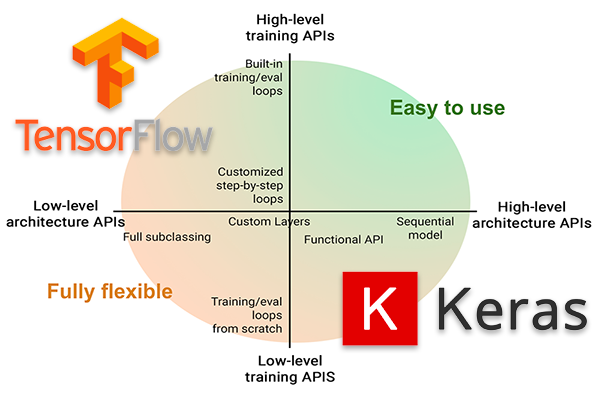

## References

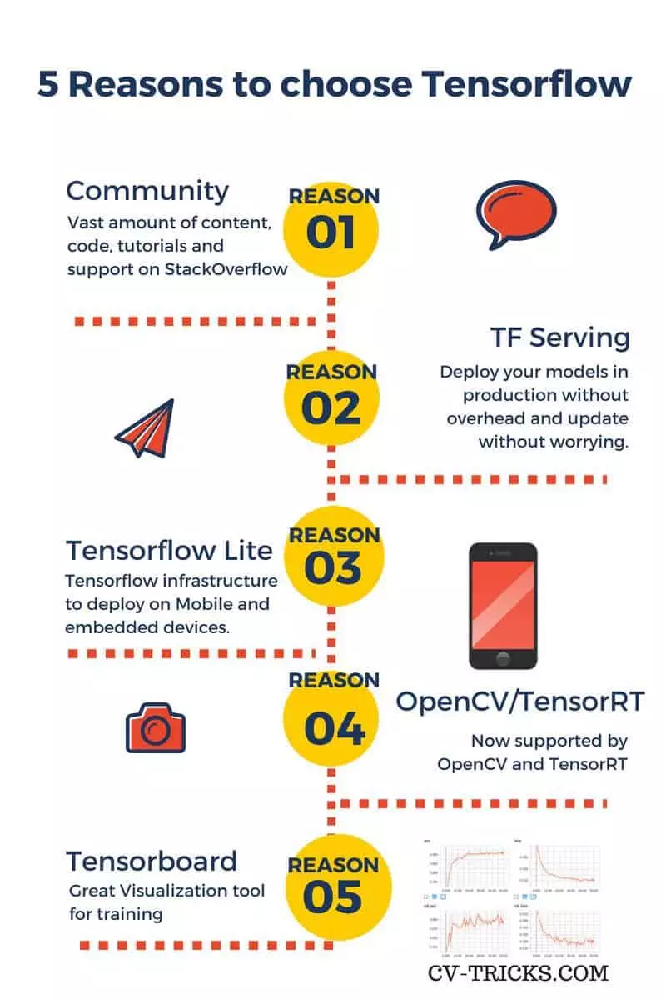

*   https://cs231n.github.io/optimization-2/
*   https://www.tensorflow.org/api_docs/python/tf/keras
*   https://github.com/lucky630/coursera
*   https://github.com/tensorflow/docs/tree/master/site/en/tutorials
*   https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb




